# Optimal growth model using interpolation

In [1]:
using Interpolations
using Optim
using BenchmarkTools
using Plots
using LinearAlgebra
include("mywrapper.jl")
gr()

Plots.GRBackend()

In [2]:
struct Model
    # primitive parameter
    β::Float64 #subjective discount factor
    σ::Float64 # relative risk aversion
    δ::Float64 #depriciation rate
    α::Float64 # capital share

    # discretize asset space
    agrid::Array{Float64,1}

    # iteration settings
    maxiter::Int64
    tol::Float64
end

In [3]:
function Construct(na=300)
    
    β = 0.95 #subjective discount factor
    σ = 2.0 # relative risk aversion
    δ = 0.1 #depriciation rate
    α = 0.33 # capital share

    # Steady state

    aterm = 1.0/β -(1.0 -δ)
    kstar = α/aterm
    kstar = kstar^(1.0/(1.0-α))

    
    # asset grid
    amin = 0.1 * kstar
    amax = 2.0 * kstar
    
    agrid =linspace(amin,amax,na)
    
    #iteration settings
    maxiter = 10000
    tol = 1e-5

    return model = Model(β, σ, δ, α, agrid, maxiter,tol)
end

Construct (generic function with 2 methods)

In [4]:
function VFI_interp(m::Model)
    
    # utility function
    u(c) = (c^(1.0-m.σ))/(1.0-m.σ)
    
    #grid size
    na = size(m.agrid, 1)
    
    v0::Array{Float64,1} = zeros(na)# initial guess of value function
    v0 = log.(m.agrid) # guess
    Tv::Array{Float64,1} = zeros(na) # update value function
    pol_a::Array{Float64,1} =zeros(na) # policy function

    # Resource　
    #This resource does not change during iteration 
    # Preallocation
    resource = zeros(na)
    @inbounds for i in 1:na
        resource[i] = m.agrid[i]^m.α+(1.0-m.δ)*m.agrid[i]
    end
    
    # value function iteration
    
    for iter in 1:m.maxiter
        #linearly extrapolate
        itp = LinearInterpolation(m.agrid, v0,extrapolation_bc = Interpolations.Linear())
        
        # using monotonicity
        temp =m.agrid[1]
        
        @fastmath @inbounds for i in  1:na
            rc =resource[i]
            objective(a_next) = - u(rc- a_next) - m.β*itp[a_next]
            
            res = optimize(objective, temp, rc,GoldenSection())
            temp= Optim.minimizer(res)#res.minimizer
            pol_a[i] = temp
            Tv[i] = - Optim.minimum(res)#res.minimum  
        end
       
        error = maximum(abs.(Tv-v0)) # update error
        v0 = copy(Tv) # update value function
        
        if error < m.tol
            break
        end
    end
    
    return v0,pol_a
end

VFI_interp (generic function with 1 method)

In [5]:
m = Construct()

Model(0.95, 2.0, 0.1, 0.33, [0.316086, 0.336172, 0.356257, 0.376343, 0.396429, 0.416515, 0.4366, 0.456686, 0.476772, 0.496858  …  6.14095, 6.16103, 6.18112, 6.20121, 6.22129, 6.24138, 6.26146, 6.28155, 6.30163, 6.32172], 10000, 1.0e-5)

In [6]:
vfun, pol_a = VFI_interp(m)

([-22.9334, -22.7945, -22.6634, -22.5394, -22.4216, -22.3095, -22.2025, -22.1001, -22.002, -21.9077  …  -15.7469, -15.7384, -15.7299, -15.7215, -15.7131, -15.7047, -15.6963, -15.688, -15.6797, -15.6714], [0.494782, 0.516943, 0.537029, 0.557115, 0.577201, 0.597726, 0.619317, 0.640705, 0.661919, 0.682974  …  5.81235, 5.82971, 5.84707, 5.86454, 5.88211, 5.89992, 5.91952, 5.93706, 5.95459, 5.97211])

In [7]:
@time VFI_interp(m);

  0.749657 seconds (10.23 M allocations: 170.374 MiB, 5.54% gc time)


In [8]:
@benchmark VFI_interp(m)

BenchmarkTools.Trial: 
  memory estimate:  170.37 MiB
  allocs estimate:  10228439
  --------------
  minimum time:     653.735 ms (1.92% GC)
  median time:      657.451 ms (1.91% GC)
  mean time:        660.817 ms (1.85% GC)
  maximum time:     673.788 ms (1.61% GC)
  --------------
  samples:          8
  evals/sample:     1

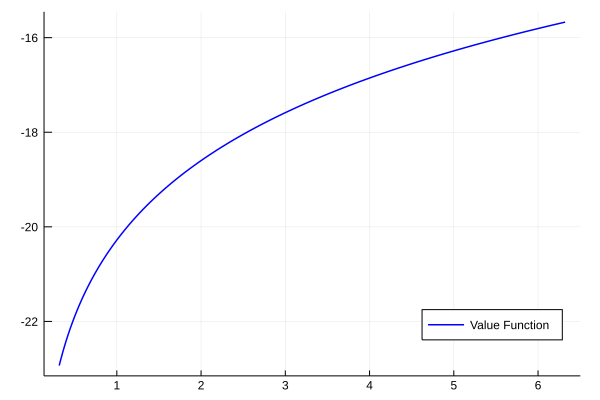

In [9]:
plot(m.agrid, vfun, color="blue", linewidth=1.5, label="Value Function",legend=:bottomright)

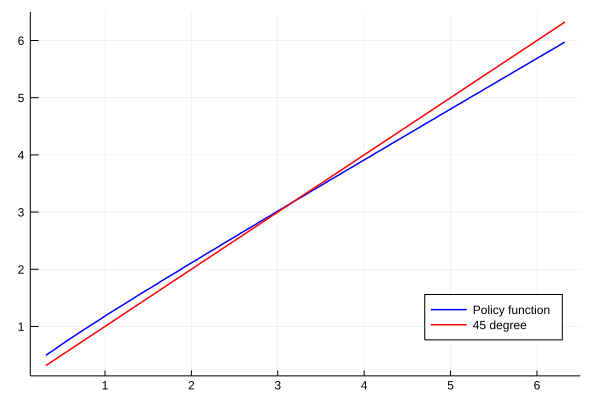

In [10]:
plot(m.agrid, pol_a, color="blue", linewidth=1.5, label="Policy function",legend=:bottomright)
plot!(m.agrid, m.agrid, color="red", linewidth=1.5, label="45 degree",legend=:bottomright)